In [1]:
import tensorflow as tf
from tensorflow import keras

/almac/paquetes/anaconda3/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/almac/paquetes/anaconda3/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/almac/paquetes/anaconda3/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/almac/paquetes/anaconda3/lib/python3.7/site-packages/tensorflow/python/f

In [2]:
def conv_block(input_tensor, num_filters):
    x = keras.layers.Conv2D(num_filters, 3, padding="same")(input_tensor)
    x = keras.layers.BatchNormalization()(x)
    x = keras.layers.Activation("relu")(x)

    x = keras.layers.Conv2D(num_filters, 3, padding="same")(x)
    x = keras.layers.BatchNormalization()(x)
    x = keras.layers.Activation("relu")(x)

    return x

def encoder_block(input_tensor, num_filters):
    x = conv_block(input_tensor, num_filters)
    p = keras.layers.MaxPool2D( (2,2) )(x)

    return x, p

def decoder_block(input_tensor, skip_features, num_filters):
    x = keras.layers.Conv2DTranspose( num_filters, (2,2), strides=2, padding="same")(input_tensor)
    x = keras.layers.Concatenate()( [x, skip_features] )
    x = conv_block(x, num_filters)

    return x

def build_unet(input_shape):
    inputs = keras.layers.Input(input_shape)

    s1, p1 = encoder_block(inputs, 64)
    s2, p2 = encoder_block(p1, 128)
    s3, p3 = encoder_block(p2, 256)
    s4, p4 = encoder_block(p3, 512)

    b1 = conv_block(p4, 1024)

    d1 = decoder_block(b1, s4, 512)
    d2 = decoder_block(d1, s3, 256)
    d3 = decoder_block(d2, s2, 128)
    d4 = decoder_block(d3, s1, 64)

    outputs = keras.layers.Conv2D(1, 1, padding="same", activation="sigmoid")(d4)

    model = tf.keras.models.Model(inputs, outputs, name="U-NET")

    return model

In [3]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [4]:
IMG_SIZE = 512
B_SIZE = 1

In [5]:
datagen = ImageDataGenerator(
    rescale = 1./255,
)

In [6]:
val_img_generator = datagen.flow_from_directory(
    'workdata/validation/',
    target_size = (IMG_SIZE,IMG_SIZE),
    color_mode = 'rgb',
    batch_size = B_SIZE,
    class_mode = None,
    seed = 1,
    shuffle = True,
    classes = ['imgs']
)

Found 40 images belonging to 1 classes.


In [7]:
val_msk_generator = datagen.flow_from_directory(
    'workdata/validation/',
    target_size = (IMG_SIZE,IMG_SIZE),
    color_mode = 'grayscale',
    batch_size = B_SIZE,
    class_mode = None,
    seed = 1,
    shuffle = True,
    classes = ['mask']
)

Found 40 images belonging to 1 classes.


In [8]:
val_generator = (pair for pair in zip(val_img_generator, val_msk_generator))

In [50]:
test_img_generator = datagen.flow_from_directory(
    'workdata/test/',
    target_size = (IMG_SIZE,IMG_SIZE),
    color_mode = 'rgb',
    batch_size = B_SIZE,
    class_mode = None,
    seed = 1,
    shuffle = True,
    classes = ['imgs']
)

Found 40 images belonging to 1 classes.


In [51]:
test_msk_generator = datagen.flow_from_directory(
    'workdata/test/',
    target_size = (IMG_SIZE,IMG_SIZE),
    color_mode = 'grayscale',
    batch_size = B_SIZE,
    class_mode = None,
    seed = 1,
    shuffle = True,
    classes = ['mask']
)

Found 40 images belonging to 1 classes.


In [53]:
test_generator = (pair for pair in zip(test_img_generator, test_msk_generator))

In [9]:
input_shape = (IMG_SIZE , IMG_SIZE , 3)

model = build_unet(input_shape)

model.compile(optimizer="adam", loss="binary_crossentropy", metrics=["acc"])

model.summary()

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Model: "U-NET"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 512, 512, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 512, 512, 64) 1792        input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 512, 512, 64) 256         conv2d[0][0]                     
________________________________________________________________________________

In [10]:
model.load_weights('Test03.h5')

In [11]:
import matplotlib.pyplot as plt

def compare3(img0, img1, img2):
    fig, ax = plt.subplots(1, 3, figsize=(15,8))
    ax[0].imshow(img0)
    ax[0].axis("off")
    ax[1].imshow(np.squeeze(img1))
    ax[1].axis("off")
    ax[2].imshow(np.squeeze(img2))
    ax[2].axis("off")
    plt.show()

In [12]:
import numpy as np

def dice_coefficient(mask, predicted_mask, t=0.5):
    mask = np.squeeze(mask)
    predicted_mask = np.squeeze(predicted_mask)
    
    mask = mask > 0.5  # Apply threshold to convert to binary mask
    predicted_mask = predicted_mask > t

    intersection = np.logical_and(mask, predicted_mask)
    intersection_area = np.sum(intersection)

    mask_area = np.sum(mask)
    predicted_mask_area = np.sum(predicted_mask)

    dice = (2.0 * intersection_area) / (mask_area + predicted_mask_area)
    return dice

def jaccard_coefficient(mask, predicted_mask, t=0.5):
    mask = np.squeeze(mask)
    predicted_mask = np.squeeze(predicted_mask)
    
    predicted_mask = predicted_mask > t

    intersection = np.logical_and(mask, predicted_mask)
    intersection_area = np.sum(intersection)

    union = np.logical_or(mask, predicted_mask)
    union_area = np.sum(union)

    jaccard = intersection_area / union_area
    return jaccard

In [21]:
X, y = next(val_generator)
predicted = model.predict(X)

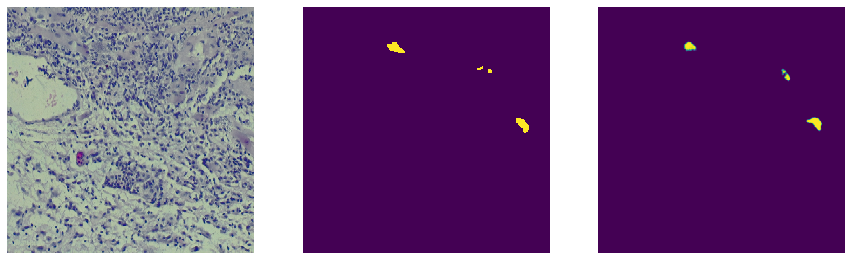

0 0.99998736 dice: 0.6898148148148148 jaccard: 0.5265017667844523 (1, 512, 512, 1)


In [24]:
for i in range(len(X)):
    compare3(X[i], y[i], predicted[i])
    print(i, np.max(predicted), "dice:", dice_coefficient(y[i], predicted[i], 0.2) , "jaccard:", jaccard_coefficient(y[i], predicted[i], 0.2), predicted.shape)

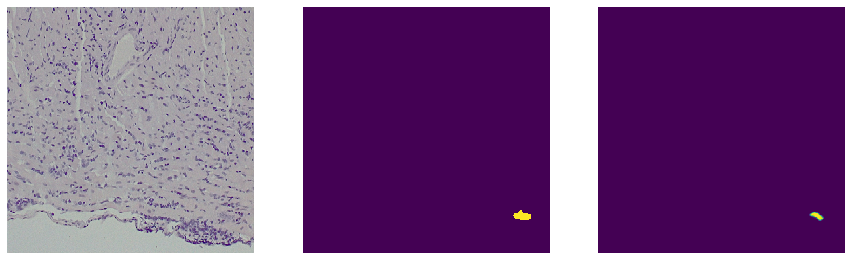

0 0.9999615 dice: 0.7184466019417476 jaccard: 0.5606060606060606 (1, 512, 512, 1)


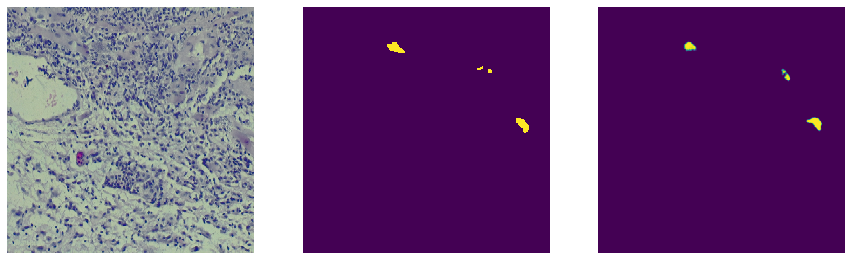

1 0.99998736 dice: 0.6898148148148148 jaccard: 0.5265017667844523 (1, 512, 512, 1)


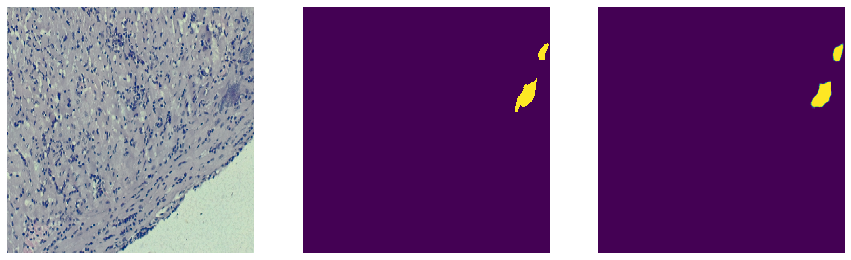

2 1.0 dice: 0.876307064524356 jaccard: 0.7798456650022696 (1, 512, 512, 1)


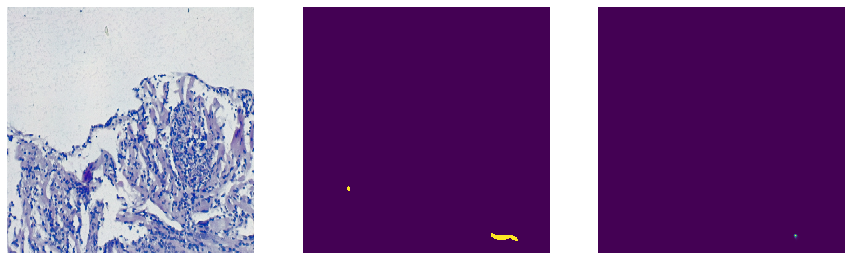

3 0.86307704 dice: 0.08919382504288165 jaccard: 0.0466786355475763 (1, 512, 512, 1)


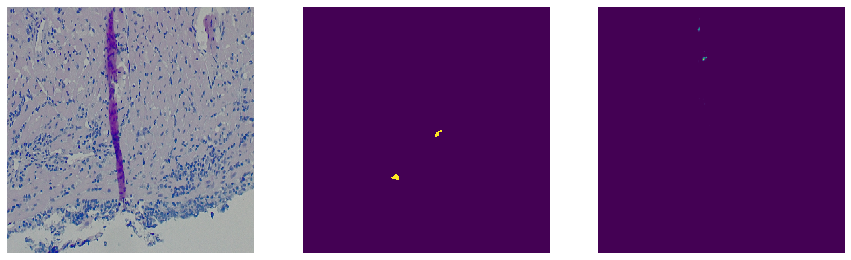

4 0.054434657 dice: 0.0 jaccard: 0.0 (1, 512, 512, 1)


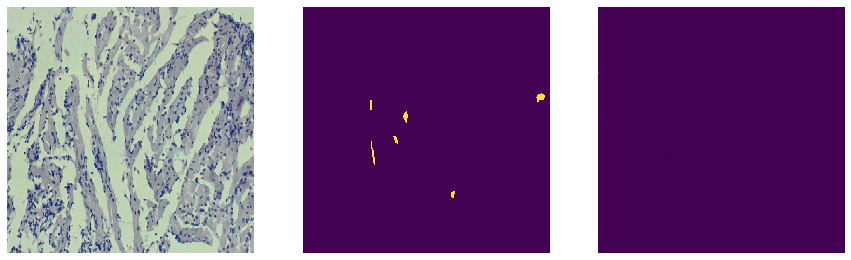

5 0.007972896 dice: 0.0 jaccard: 0.0 (1, 512, 512, 1)


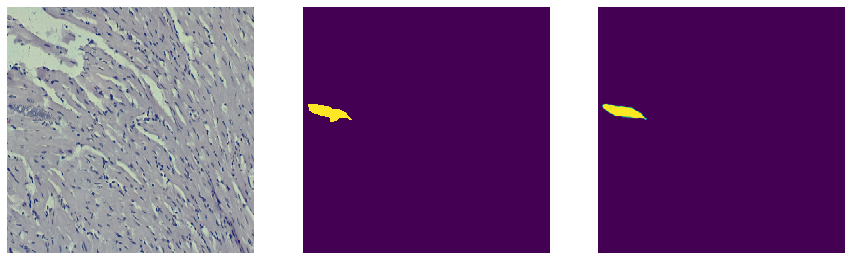

6 0.9999994 dice: 0.9152646069134291 jaccard: 0.8437676254935138 (1, 512, 512, 1)


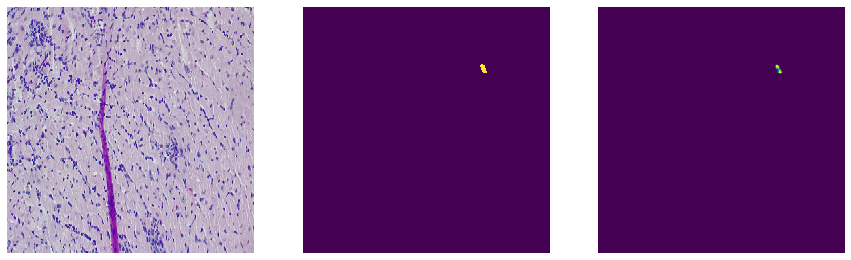

7 0.99208117 dice: 0.825503355704698 jaccard: 0.7028571428571428 (1, 512, 512, 1)


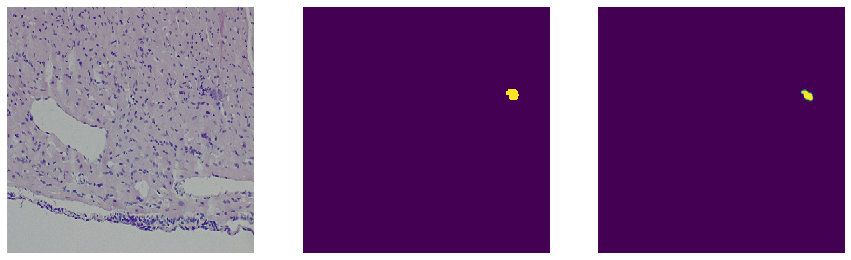

8 0.9999934 dice: 0.8303249097472925 jaccard: 0.7098765432098766 (1, 512, 512, 1)


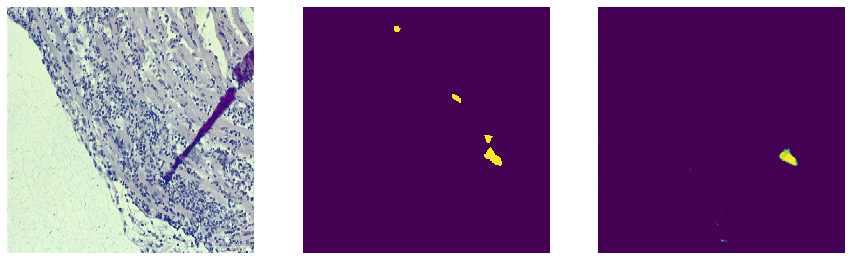

9 0.9999893 dice: 0.6508313539192399 jaccard: 0.4823943661971831 (1, 512, 512, 1)


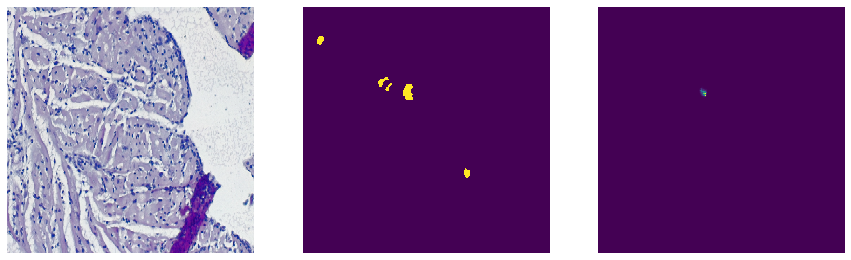

10 0.29207557 dice: 0.02159468438538206 jaccard: 0.0109151973131822 (1, 512, 512, 1)


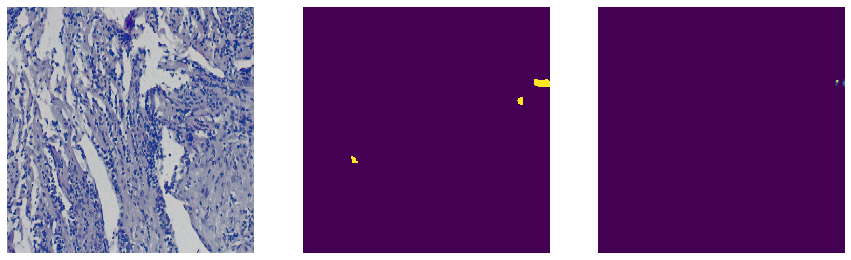

11 0.6751479 dice: 0.11907654921020656 jaccard: 0.06330749354005168 (1, 512, 512, 1)


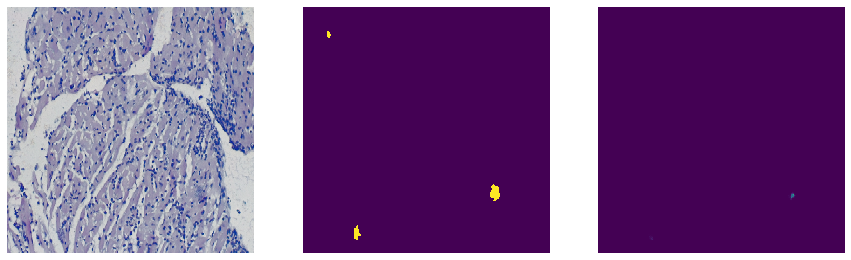

12 0.053318113 dice: 0.0 jaccard: 0.0 (1, 512, 512, 1)


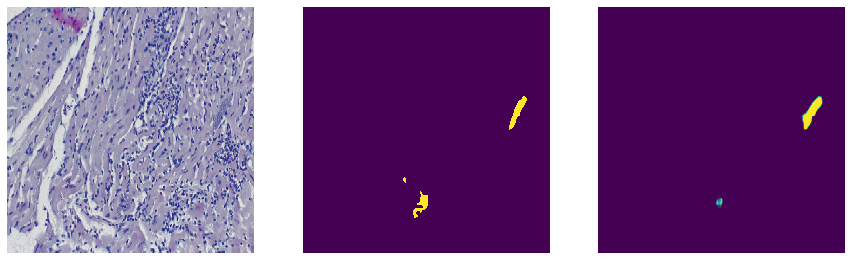

13 0.99999815 dice: 0.6718047527296083 jaccard: 0.5058027079303675 (1, 512, 512, 1)


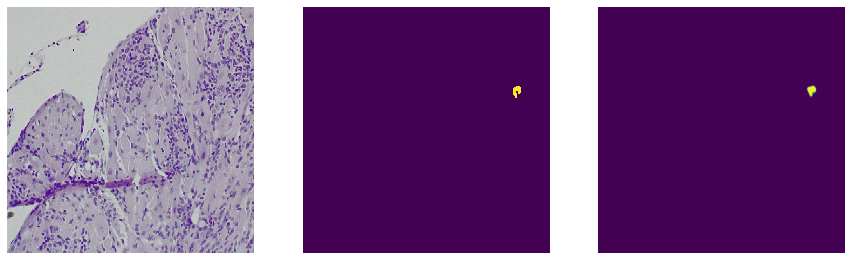

14 0.9999908 dice: 0.8481848184818482 jaccard: 0.7363896848137536 (1, 512, 512, 1)


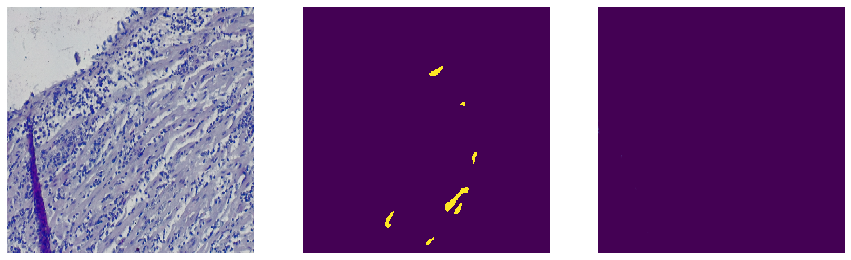

15 0.0017141998 dice: 0.0 jaccard: 0.0 (1, 512, 512, 1)


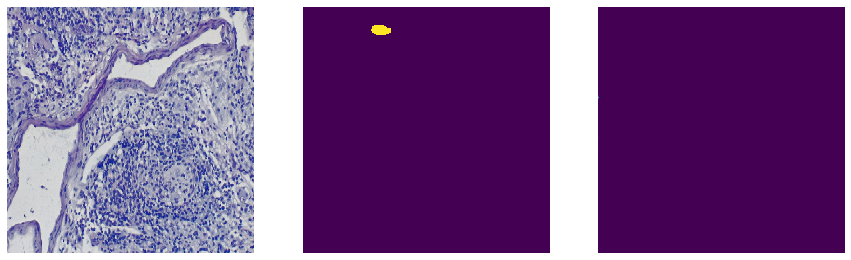

16 0.011954963 dice: 0.0 jaccard: 0.0 (1, 512, 512, 1)


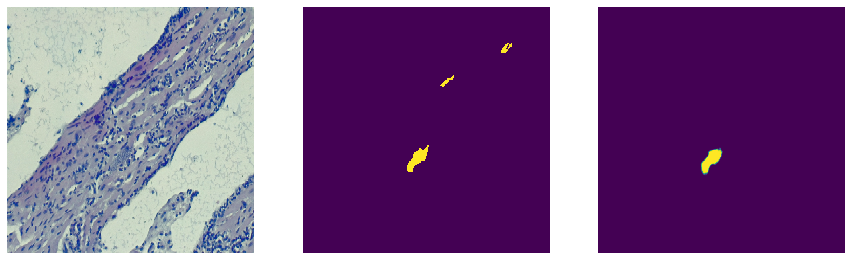

17 0.99999833 dice: 0.7340690637237451 jaccard: 0.5798650168728909 (1, 512, 512, 1)


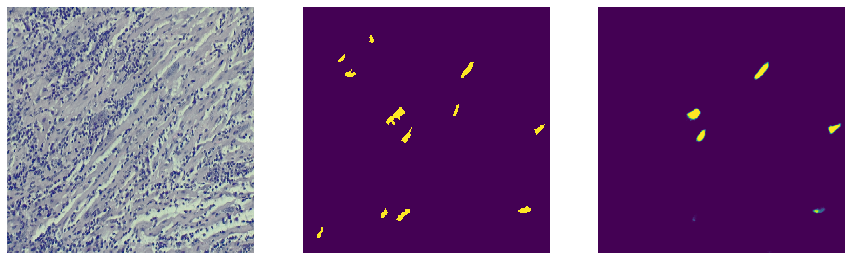

18 0.99999905 dice: 0.5512538495380555 jaccard: 0.3805040996052232 (1, 512, 512, 1)


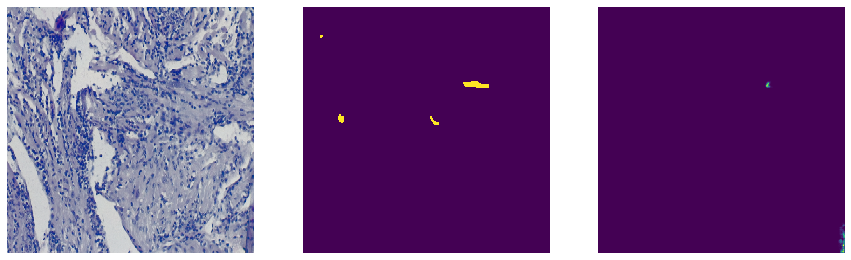

19 0.86335874 dice: 0.09947643979057591 jaccard: 0.05234159779614325 (1, 512, 512, 1)


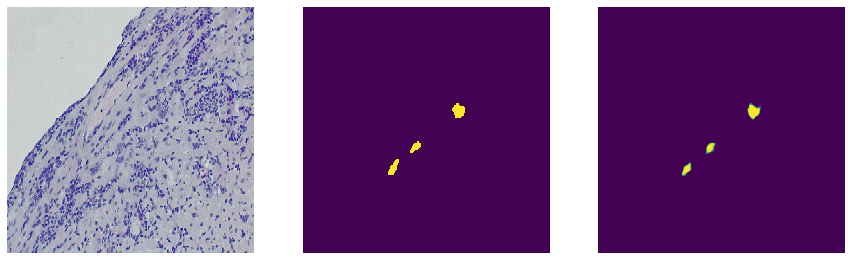

20 0.9999944 dice: 0.8439121756487026 jaccard: 0.7299723756906077 (1, 512, 512, 1)


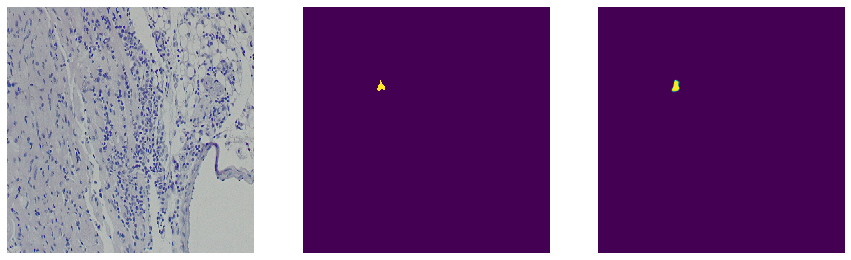

21 0.99999785 dice: 0.7795918367346939 jaccard: 0.6387959866220736 (1, 512, 512, 1)


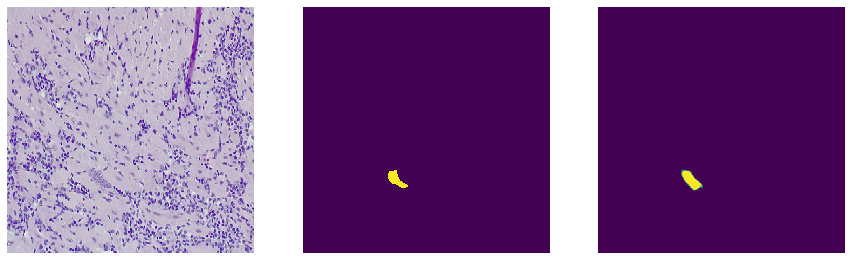

22 0.9999968 dice: 0.8162564396107613 jaccard: 0.6895551257253385 (1, 512, 512, 1)


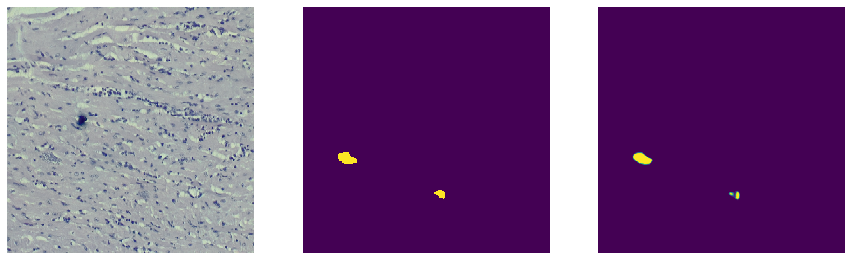

23 0.99999994 dice: 0.9044585987261147 jaccard: 0.8255813953488372 (1, 512, 512, 1)


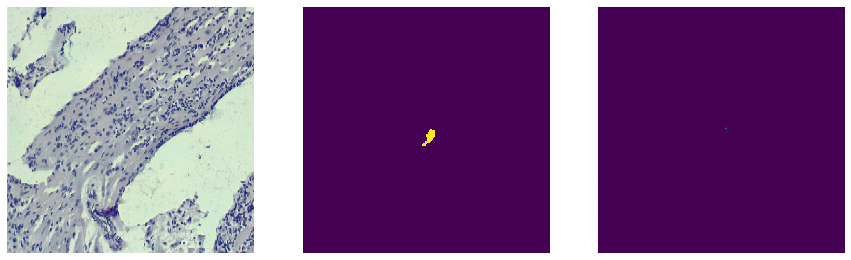

24 0.0002194643 dice: 0.0 jaccard: 0.0 (1, 512, 512, 1)


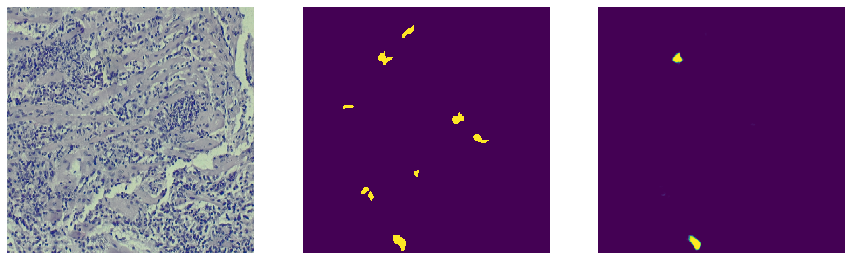

25 0.9999885 dice: 0.45330915684496825 jaccard: 0.29308323563892147 (1, 512, 512, 1)


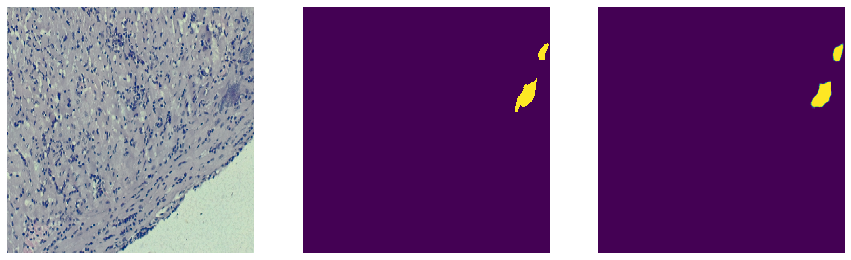

26 1.0 dice: 0.876307064524356 jaccard: 0.7798456650022696 (1, 512, 512, 1)


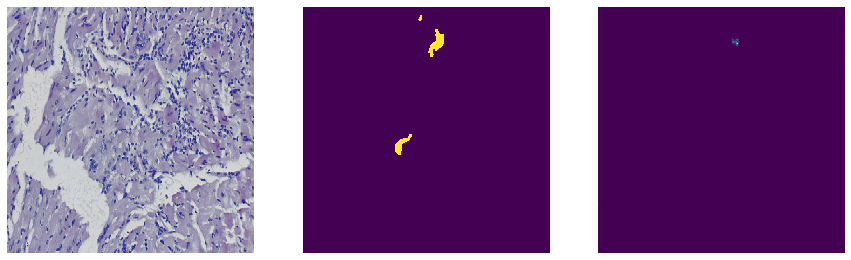

27 0.016689241 dice: 0.0 jaccard: 0.0 (1, 512, 512, 1)


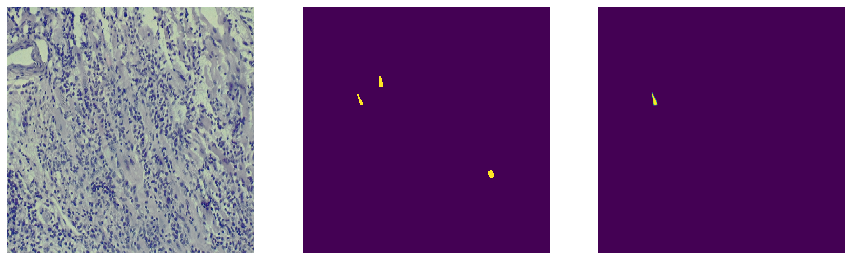

28 0.9997894 dice: 0.3727598566308244 jaccard: 0.2290748898678414 (1, 512, 512, 1)


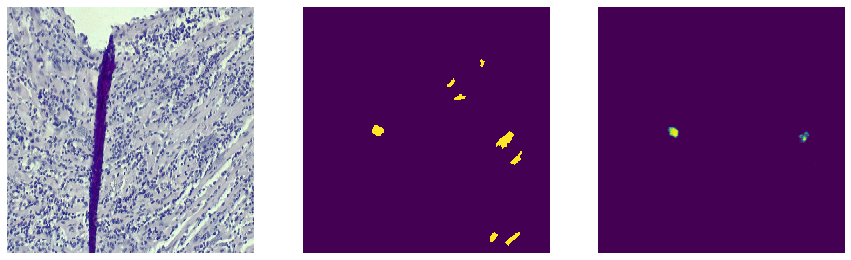

29 0.9976851 dice: 0.3517169614984391 jaccard: 0.21338383838383837 (1, 512, 512, 1)


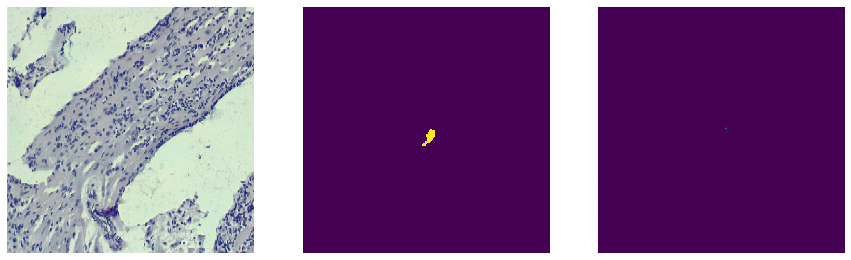

30 0.0002194643 dice: 0.0 jaccard: 0.0 (1, 512, 512, 1)


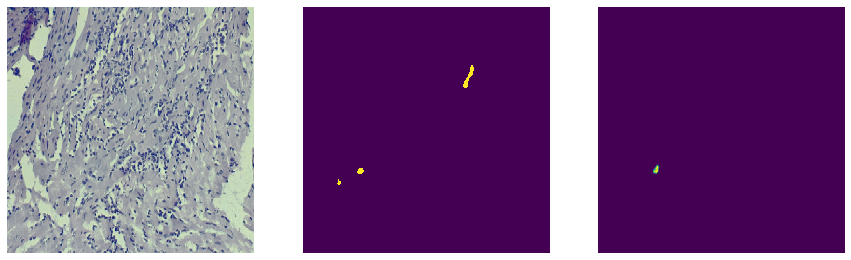

31 0.98852074 dice: 0.3216216216216216 jaccard: 0.19162640901771336 (1, 512, 512, 1)


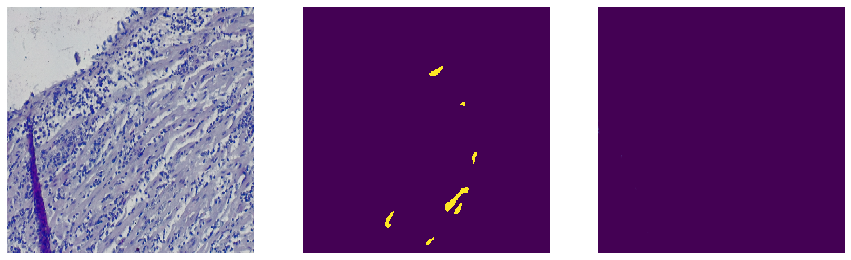

32 0.0017141998 dice: 0.0 jaccard: 0.0 (1, 512, 512, 1)


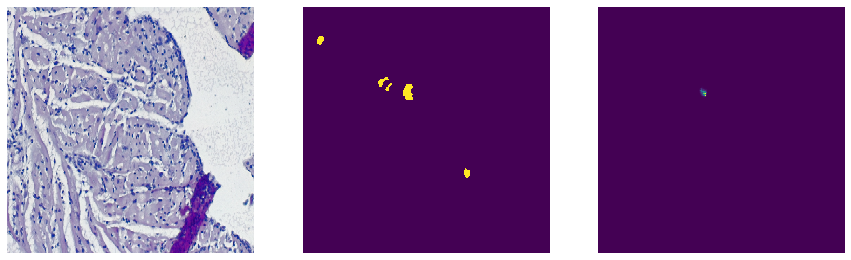

33 0.29207557 dice: 0.02159468438538206 jaccard: 0.0109151973131822 (1, 512, 512, 1)


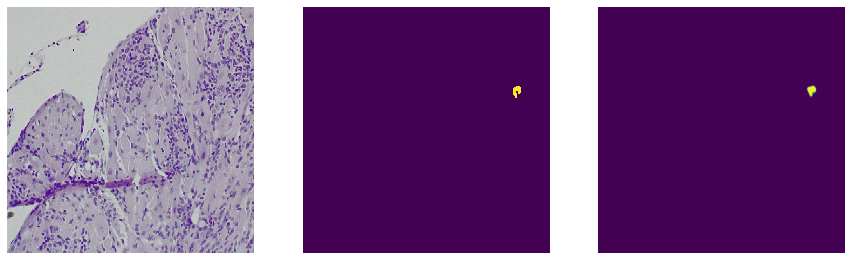

34 0.9999908 dice: 0.8481848184818482 jaccard: 0.7363896848137536 (1, 512, 512, 1)


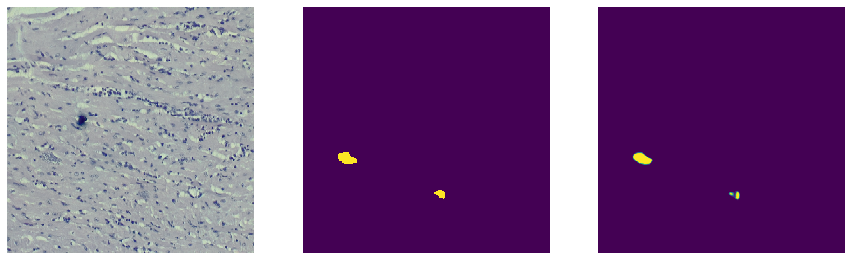

35 0.99999994 dice: 0.9044585987261147 jaccard: 0.8255813953488372 (1, 512, 512, 1)


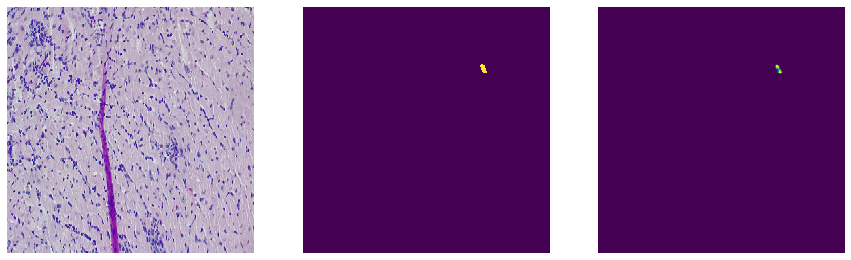

36 0.99208117 dice: 0.825503355704698 jaccard: 0.7028571428571428 (1, 512, 512, 1)


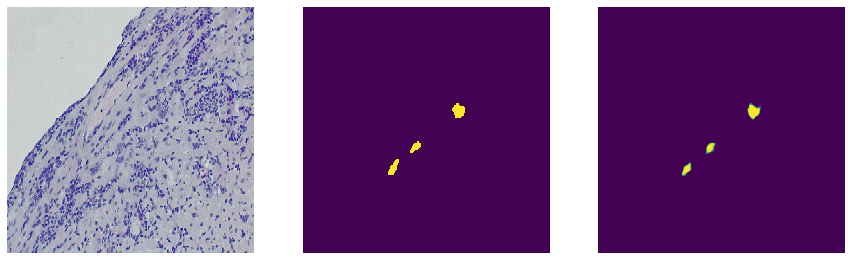

37 0.9999944 dice: 0.8439121756487026 jaccard: 0.7299723756906077 (1, 512, 512, 1)


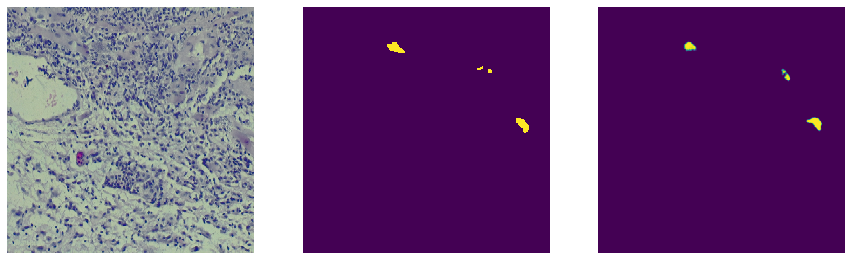

38 0.99998736 dice: 0.6898148148148148 jaccard: 0.5265017667844523 (1, 512, 512, 1)


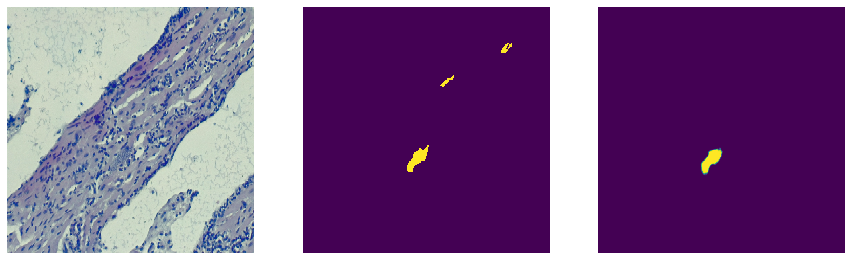

39 0.99999833 dice: 0.7340690637237451 jaccard: 0.5798650168728909 (1, 512, 512, 1)
0.49236913553112
0.40196805586531487


In [46]:
d = []
j = []

for m in range(40):
    X, y = next(val_generator)
    predicted = model.predict(X)

    t = 0.1
    i = 0

    compare3(X[i], y[i], predicted[i])
    print(m, np.max(predicted), "dice:", dice_coefficient(y[i], predicted[i], 0.2) , "jaccard:", jaccard_coefficient(y[i], predicted[i], 0.2), predicted.shape)

    d.append(dice_coefficient(y[i], predicted[i], t))
    j.append(jaccard_coefficient(y[i], predicted[i], t))

print(sum(d)/len(d))
print(sum(j)/len(j))    

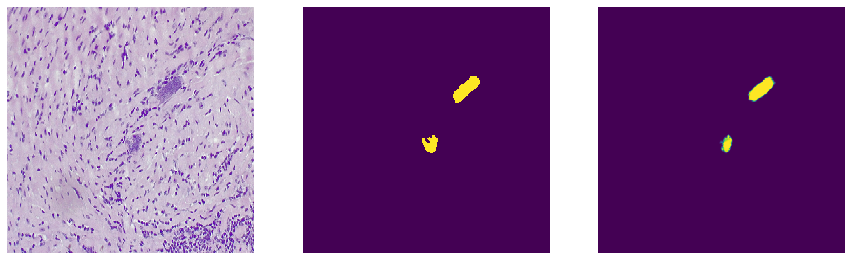

0 0.99999714 dice: 0.8847135235444212 jaccard: 0.793261231281198 (1, 512, 512, 1)


In [38]:
X, y = next(val_generator)
predicted = model.predict(X)

i = 0

compare3(X[i], y[i], predicted[i])
print(i, np.max(predicted), "dice:", dice_coefficient(y[i], predicted[i], 0.2) , "jaccard:", jaccard_coefficient(y[i], predicted[i], 0.2), predicted.shape)

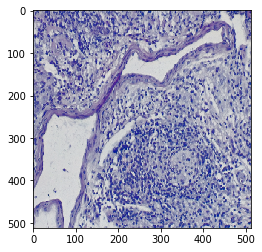

In [20]:
plt.imshow(X[0])

In [40]:
def dice_coefficient_t(mask, predicted_mask, t=0.5):
    mask = tf.cast(mask > 0.5, dtype=tf.float32)  # Apply threshold and convert to float32
    predicted_mask = tf.cast(predicted_mask > t, dtype=tf.float32)  # Apply threshold and convert to float32

    intersection = tf.reduce_sum(tf.cast(tf.logical_and(tf.cast(mask, dtype=tf.bool), tf.cast(predicted_mask, dtype=tf.bool)), dtype=tf.float32))
    intersection_area = tf.reduce_sum(intersection)

    mask_area = tf.reduce_sum(mask)
    predicted_mask_area = tf.reduce_sum(predicted_mask)

    dice = (2.0 * intersection_area) / (mask_area + predicted_mask_area)
    return dice

def ev_dice(mask, predicted_mask, t=0.5):

    dice = dice_coefficient_t(mask, predicted_mask, t=t)

    with tf.Session() as sess:
        dice_value = sess.run(dice)
    return dice_value

In [41]:
def jaccard_coefficient_t(mask, predicted_mask, t=0.5):
    mask = tf.cast(mask, dtype=tf.float32)
    predicted_mask = tf.cast(predicted_mask > t, dtype=tf.float32)

    intersection = tf.reduce_sum(tf.cast(tf.logical_and(tf.cast(mask, dtype=tf.bool), tf.cast(predicted_mask, dtype=tf.bool)), dtype=tf.float32))
    intersection_area = tf.reduce_sum(intersection)

    union = tf.reduce_sum(tf.cast(tf.logical_or(tf.cast(mask, dtype=tf.bool), tf.cast(predicted_mask, dtype=tf.bool)), dtype=tf.float32))
    union_area = tf.reduce_sum(union)

    jaccard = intersection_area / union_area
    return jaccard

def ev_jaccard(mask, predicted_mask, t=0.5):

    jaccard = jaccard_coefficient_t(mask, predicted_mask, t=t)

    with tf.Session() as sess:
        jaccard_value = sess.run(jaccard)
    return jaccard_value

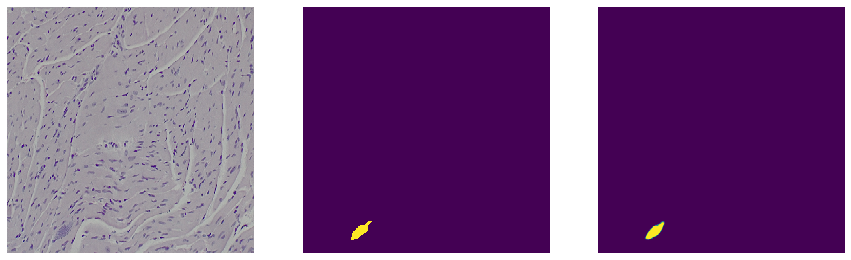

0 0.999999 dice: 0.91168094 jaccard: 0.8376963 (1, 512, 512, 1)


In [43]:
for i in range(len(X)):
    compare3(X[i], y[i], predicted[i])
    print(i, np.max(predicted), "dice:", ev_dice(y[i], predicted[i], 0.3) , "jaccard:", ev_jaccard(y[i], predicted[i], 0.3), predicted.shape)

In [18]:
dice_coefficient(y, predicted)

0.6686522710349962

In [19]:
ev_dice(y, predicted)

0.6686523

In [20]:
jaccard_coefficient(y, predicted)

0.5022371364653244

In [21]:
ev_jaccard(y, predicted)

0.50223714

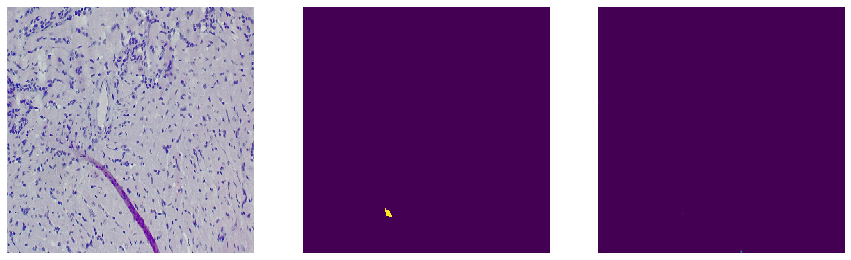

0 0.008107752 dice: 0.0 jaccard: 0.0 (1, 512, 512, 1)


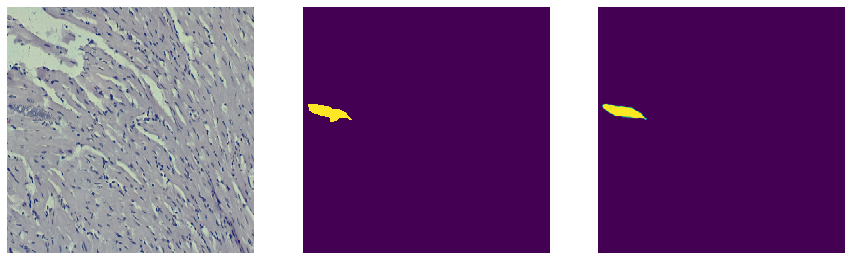

1 0.9999994 dice: 0.9152646069134291 jaccard: 0.8437676254935138 (1, 512, 512, 1)


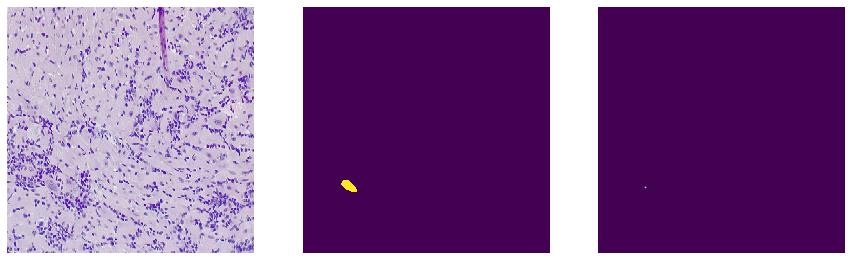

2 0.07519257 dice: 0.0 jaccard: 0.0 (1, 512, 512, 1)


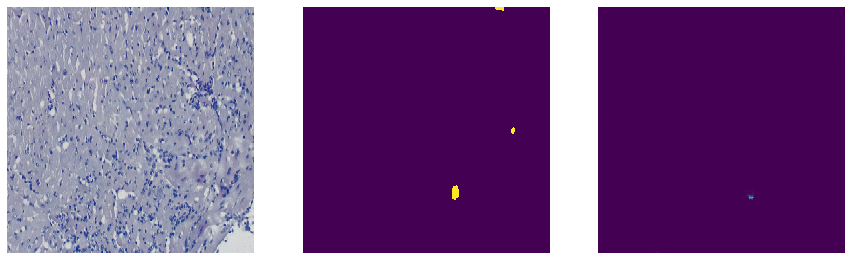

3 0.032510877 dice: 0.0 jaccard: 0.0 (1, 512, 512, 1)


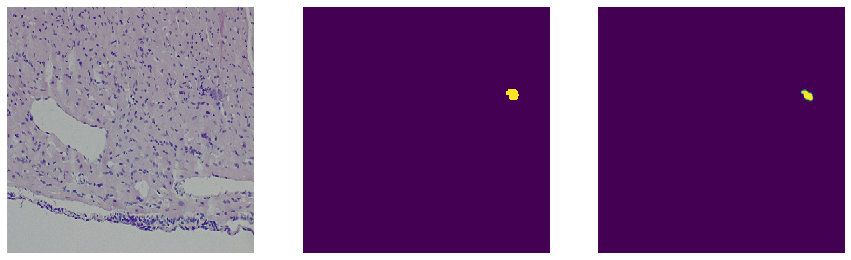

4 0.9999934 dice: 0.8303249097472925 jaccard: 0.7098765432098766 (1, 512, 512, 1)


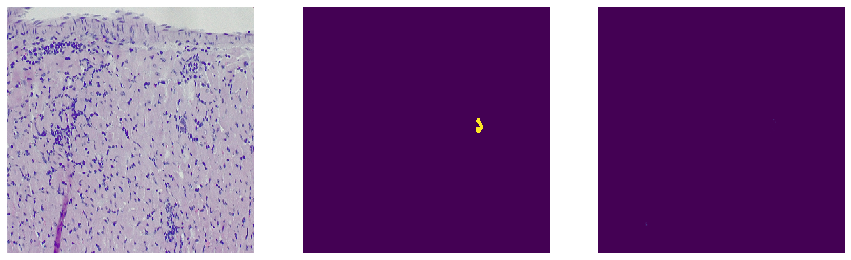

5 0.19208345 dice: 0.0 jaccard: 0.0 (1, 512, 512, 1)


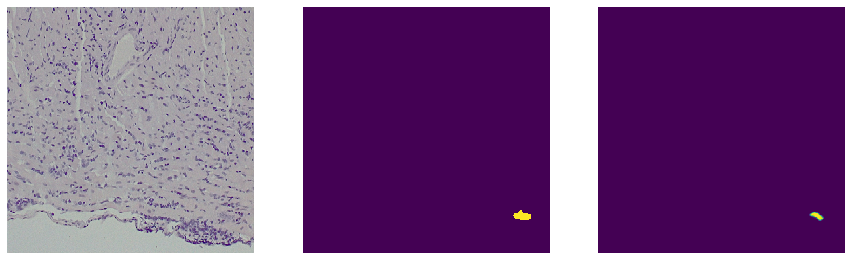

6 0.9999615 dice: 0.7184466019417476 jaccard: 0.5606060606060606 (1, 512, 512, 1)


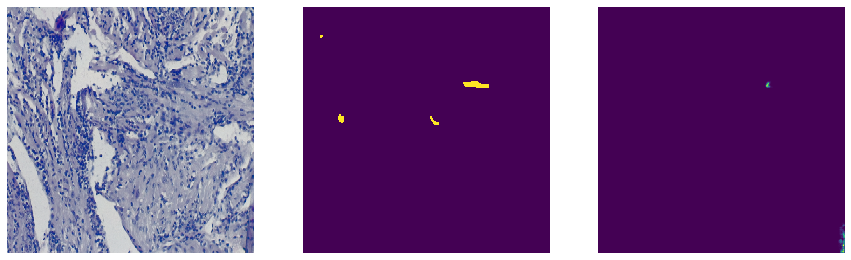

7 0.86335874 dice: 0.09947643979057591 jaccard: 0.05234159779614325 (1, 512, 512, 1)


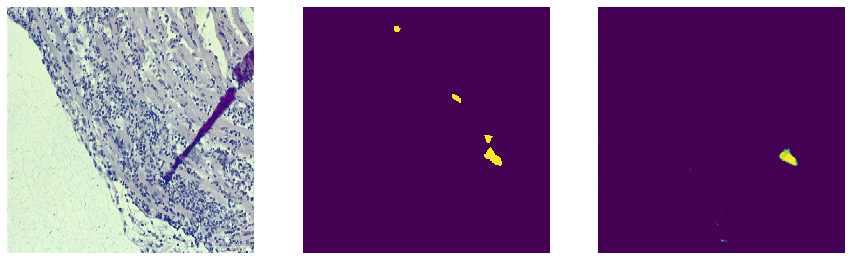

8 0.9999893 dice: 0.6508313539192399 jaccard: 0.4823943661971831 (1, 512, 512, 1)


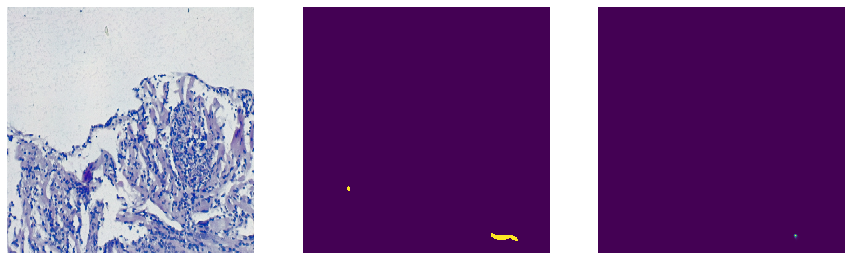

9 0.86307704 dice: 0.08919382504288165 jaccard: 0.0466786355475763 (1, 512, 512, 1)


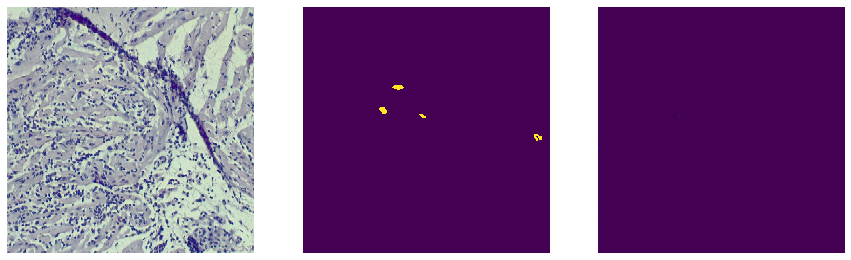

10 0.0010799766 dice: 0.0 jaccard: 0.0 (1, 512, 512, 1)


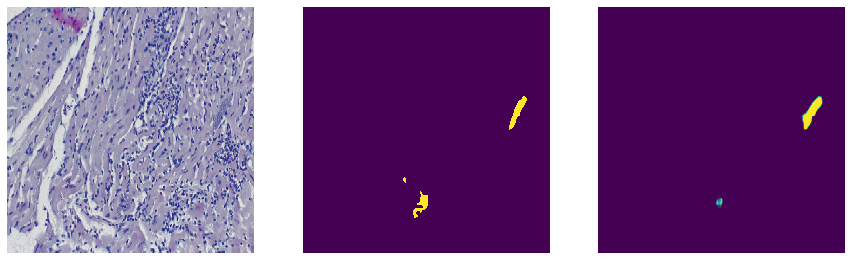

11 0.99999815 dice: 0.6718047527296083 jaccard: 0.5058027079303675 (1, 512, 512, 1)


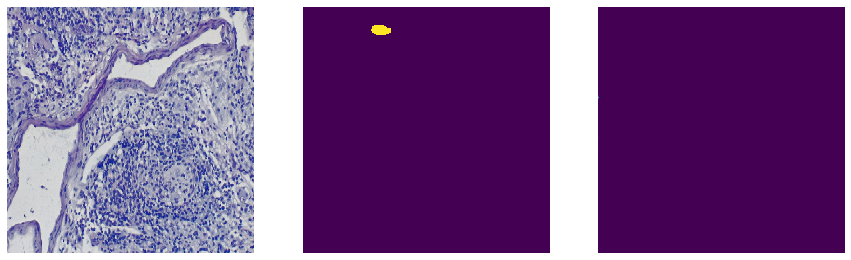

12 0.011954963 dice: 0.0 jaccard: 0.0 (1, 512, 512, 1)


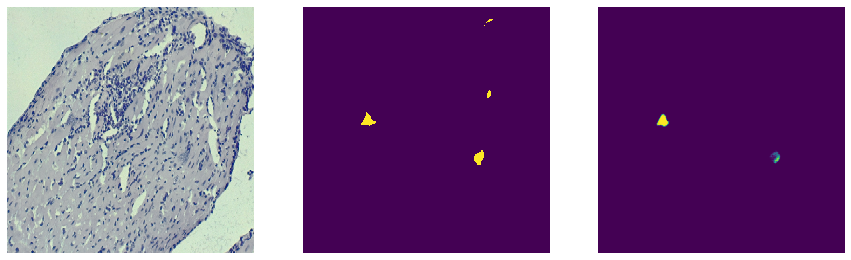

13 0.99999857 dice: 0.6553603876438522 jaccard: 0.4873873873873874 (1, 512, 512, 1)


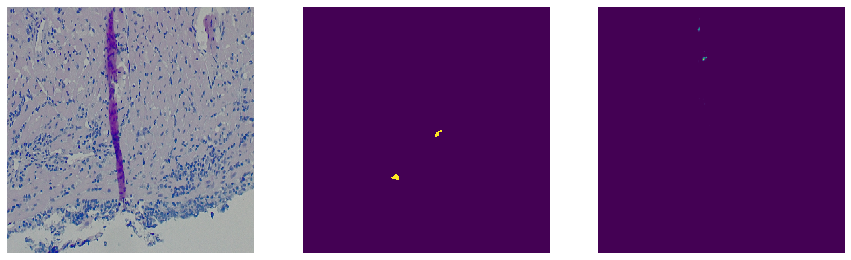

14 0.054434657 dice: 0.0 jaccard: 0.0 (1, 512, 512, 1)


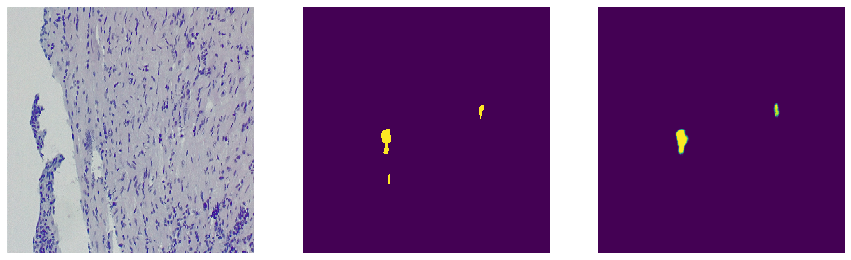

15 0.9999956 dice: 0.7883008356545961 jaccard: 0.6505747126436782 (1, 512, 512, 1)


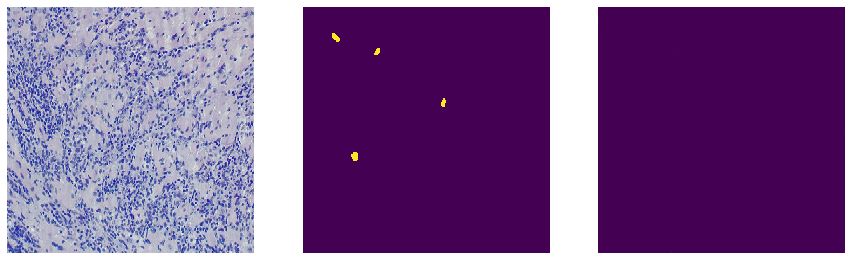

16 0.0025375485 dice: 0.0 jaccard: 0.0 (1, 512, 512, 1)


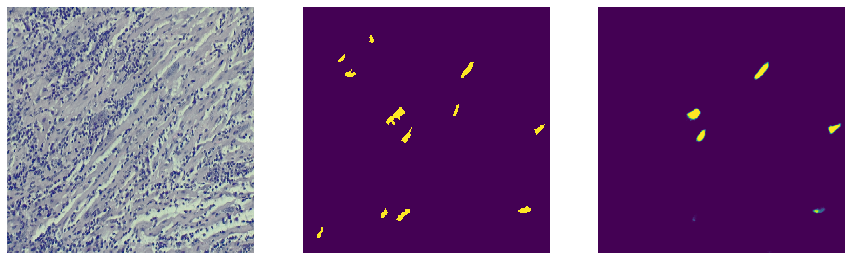

17 0.99999905 dice: 0.5512538495380555 jaccard: 0.3805040996052232 (1, 512, 512, 1)


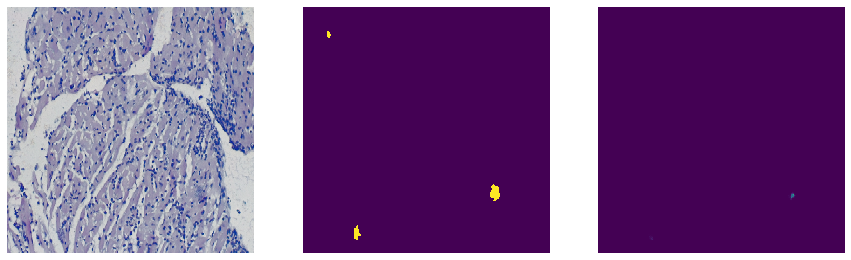

18 0.053318113 dice: 0.0 jaccard: 0.0 (1, 512, 512, 1)


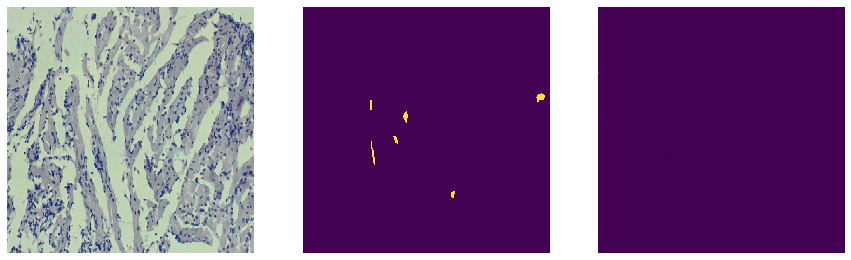

19 0.007972896 dice: 0.0 jaccard: 0.0 (1, 512, 512, 1)


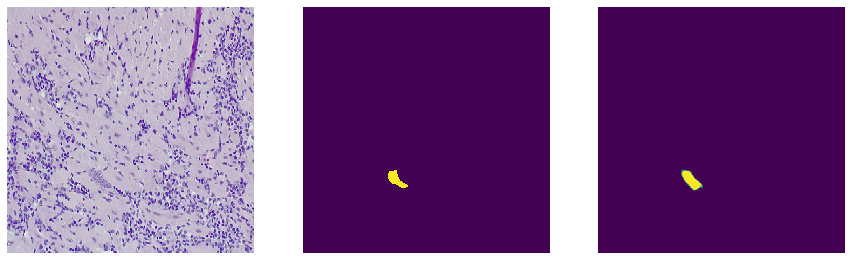

20 0.9999968 dice: 0.8162564396107613 jaccard: 0.6895551257253385 (1, 512, 512, 1)


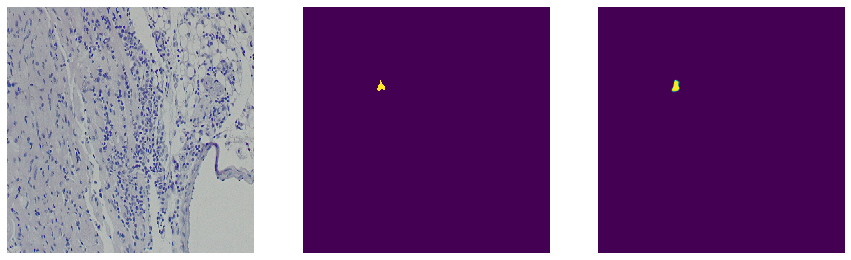

21 0.99999785 dice: 0.7795918367346939 jaccard: 0.6387959866220736 (1, 512, 512, 1)


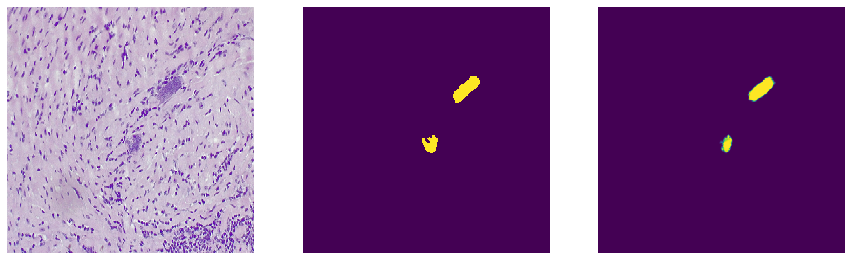

22 0.99999714 dice: 0.8847135235444212 jaccard: 0.793261231281198 (1, 512, 512, 1)


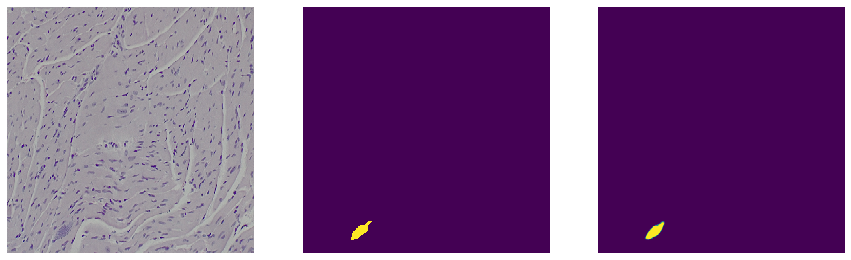

23 0.999999 dice: 0.9138051857042747 jaccard: 0.8412903225806452 (1, 512, 512, 1)


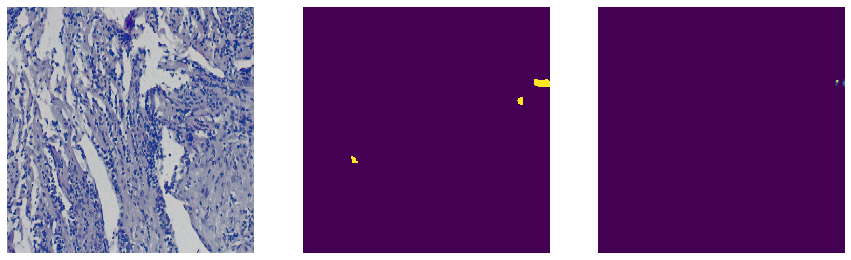

24 0.6751479 dice: 0.11907654921020656 jaccard: 0.06330749354005168 (1, 512, 512, 1)


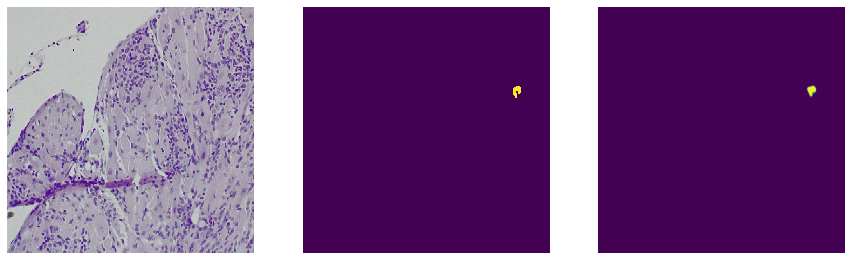

25 0.9999908 dice: 0.8481848184818482 jaccard: 0.7363896848137536 (1, 512, 512, 1)


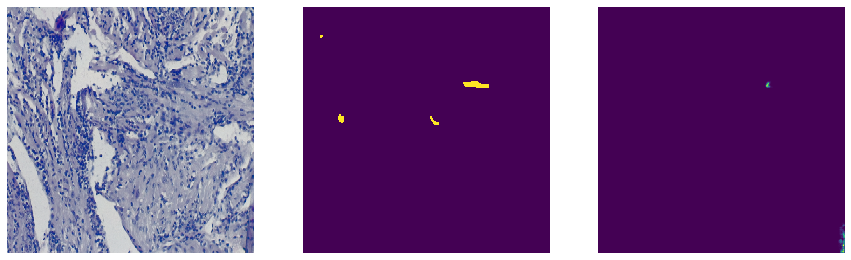

26 0.86335874 dice: 0.09947643979057591 jaccard: 0.05234159779614325 (1, 512, 512, 1)


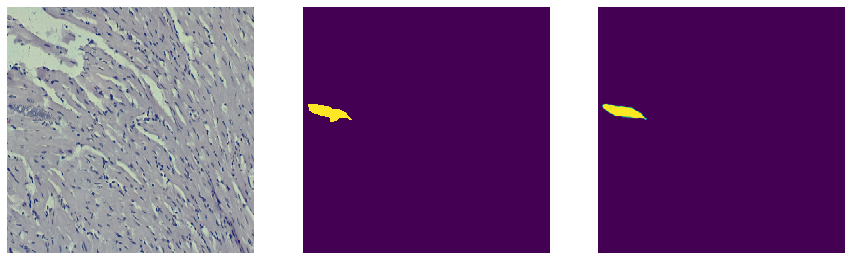

27 0.9999994 dice: 0.9152646069134291 jaccard: 0.8437676254935138 (1, 512, 512, 1)


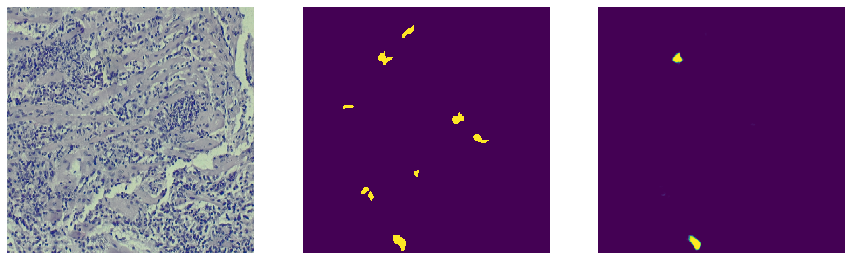

28 0.9999885 dice: 0.45330915684496825 jaccard: 0.29308323563892147 (1, 512, 512, 1)


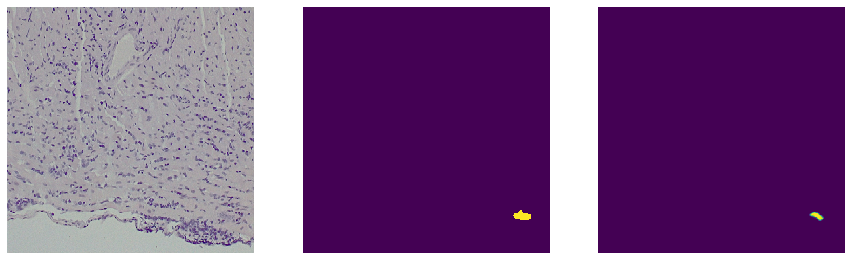

29 0.9999615 dice: 0.7184466019417476 jaccard: 0.5606060606060606 (1, 512, 512, 1)


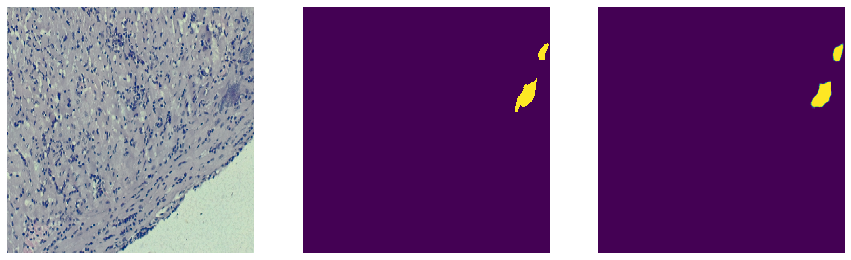

30 1.0 dice: 0.876307064524356 jaccard: 0.7798456650022696 (1, 512, 512, 1)


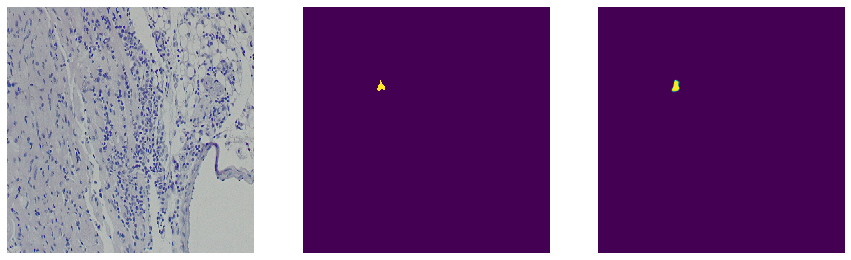

31 0.99999785 dice: 0.7795918367346939 jaccard: 0.6387959866220736 (1, 512, 512, 1)


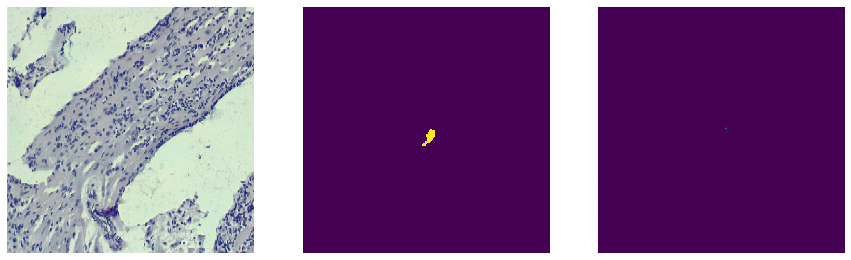

32 0.0002194643 dice: 0.0 jaccard: 0.0 (1, 512, 512, 1)


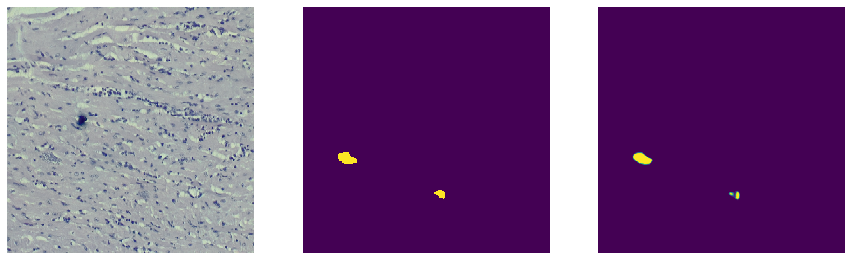

33 0.99999994 dice: 0.9044585987261147 jaccard: 0.8255813953488372 (1, 512, 512, 1)


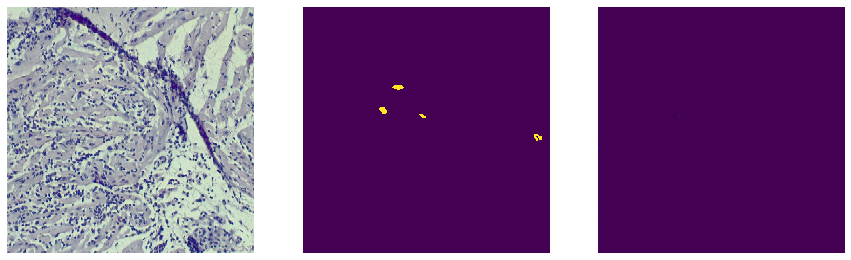

34 0.0010799766 dice: 0.0 jaccard: 0.0 (1, 512, 512, 1)


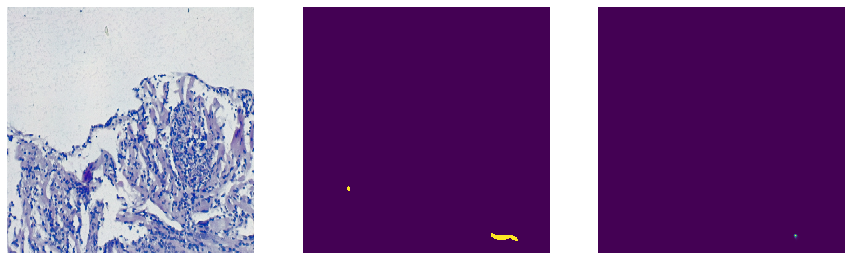

35 0.86307704 dice: 0.08919382504288165 jaccard: 0.0466786355475763 (1, 512, 512, 1)


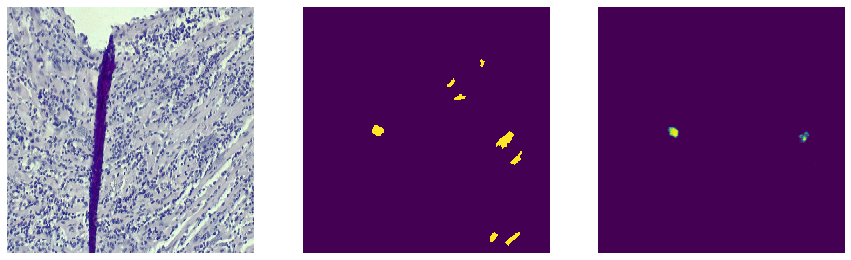

36 0.9976851 dice: 0.3517169614984391 jaccard: 0.21338383838383837 (1, 512, 512, 1)


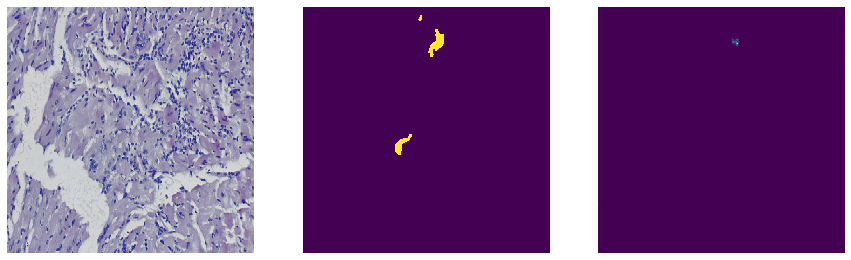

37 0.016689241 dice: 0.0 jaccard: 0.0 (1, 512, 512, 1)


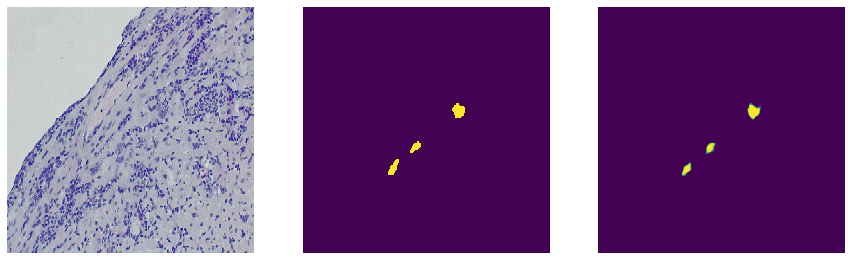

38 0.9999944 dice: 0.8439121756487026 jaccard: 0.7299723756906077 (1, 512, 512, 1)


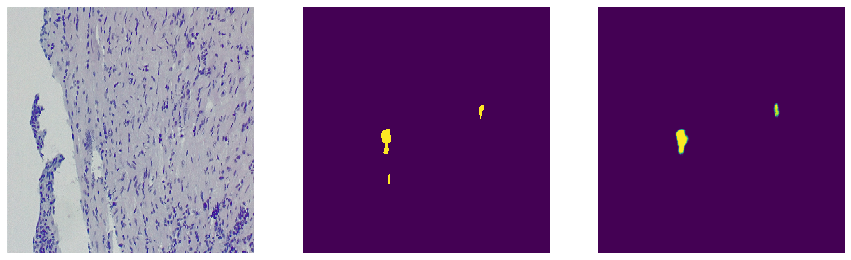

39 0.9999956 dice: 0.7883008356545961 jaccard: 0.6505747126436782 (1, 512, 512, 1)
0.43482496167838064
0.3572218741740577


In [54]:
d = []
j = []

X, y = next(test_generator)
predicted = model.predict(X)

for m in range(40):
    X, y = next(val_generator)
    predicted = model.predict(X)

    t = 0.1
    i = 0

    compare3(X[i], y[i], predicted[i])
    print(m, np.max(predicted), "dice:", dice_coefficient(y[i], predicted[i], 0.2) , "jaccard:", jaccard_coefficient(y[i], predicted[i], 0.2), predicted.shape)

    d.append(dice_coefficient(y[i], predicted[i], t))
    j.append(jaccard_coefficient(y[i], predicted[i], t))

print(sum(d)/len(d))
print(sum(j)/len(j)) 

In [ ]:
tf.__version__